In [29]:
#!git clone https://github.com/faeiqkhan/Model_data

In [30]:
!ls Model_data

Data  README.md


In [31]:
!pip3 install imgaug

In [32]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import keras
from keras.models import Sequential
from keras.optimizers import Adam
from keras.layers import Convolution2D, MaxPooling2D, Dropout, Flatten, Dense
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
import pandas as pd
import ntpath
import random

In [33]:
datadir = '/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data'
columns = ['center', 'left', 'right', 'steering', 'throttle', 'reverse', 'speed']
data = pd.read_csv(os.path.join(datadir, 'driving_log.csv'), names = columns)
pd.set_option('display.max_colwidth', 1)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/center_2024_11_03_19_03_48_780.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/left_2024_11_03_19_03_48_780.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/right_2024_11_03_19_03_48_780.jpg,0.0,0.0,0.0,0.000078
1,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/center_2024_11_03_19_03_48_867.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/left_2024_11_03_19_03_48_867.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/right_2024_11_03_19_03_48_867.jpg,0.0,0.0,0.0,0.000078
2,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/center_2024_11_03_19_03_48_968.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/left_2024_11_03_19_03_48_968.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/right_2024_11_03_19_03_48_968.jpg,0.0,0.0,0.0,0.000078
3,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/center_2024_11_03_19_03_49_068.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/left_2024_11_03_19_03_49_068.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/right_2024_11_03_19_03_49_068.jpg,0.0,0.0,0.0,0.000078
4,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/center_2024_11_03_19_03_49_168.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/left_2024_11_03_19_03_49_168.jpg,/home/anonymous/Desktop/sdc_model/Behaviorall_Cloning/test_data/IMG/right_2024_11_03_19_03_49_168.jpg,0.0,0.0,0.0,0.000083


In [34]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail
data['center'] = data['center'].apply(path_leaf)
data['left'] = data['left'].apply(path_leaf)
data['right'] = data['right'].apply(path_leaf)
data.head()

,center,left,right,steering,throttle,reverse,speed
0,center_2024_11_03_19_03_48_780.jpg,left_2024_11_03_19_03_48_780.jpg,right_2024_11_03_19_03_48_780.jpg,0.0,0.0,0.0,0.000078
1,center_2024_11_03_19_03_48_867.jpg,left_2024_11_03_19_03_48_867.jpg,right_2024_11_03_19_03_48_867.jpg,0.0,0.0,0.0,0.000078
2,center_2024_11_03_19_03_48_968.jpg,left_2024_11_03_19_03_48_968.jpg,right_2024_11_03_19_03_48_968.jpg,0.0,0.0,0.0,0.000078
3,center_2024_11_03_19_03_49_068.jpg,left_2024_11_03_19_03_49_068.jpg,right_2024_11_03_19_03_49_068.jpg,0.0,0.0,0.0,0.000078
4,center_2024_11_03_19_03_49_168.jpg,left_2024_11_03_19_03_49_168.jpg,right_2024_11_03_19_03_49_168.jpg,0.0,0.0,0.0,0.000083


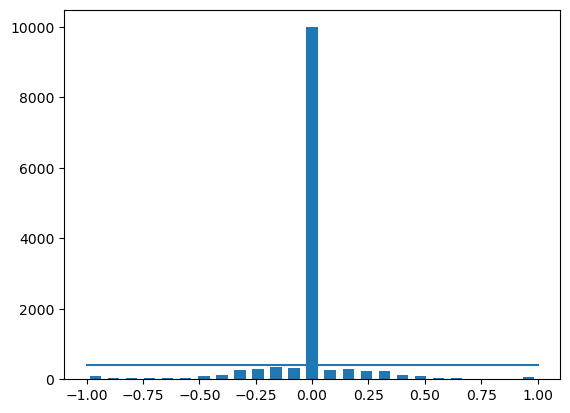

In [35]:
num_bins = 25
samples_per_bin = 400
hist, bins = np.histogram(data['steering'], num_bins)
center = (bins[:-1]+ bins[1:]) * 0.5
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

total data: 13072
removed: 9583
remaining: 3489


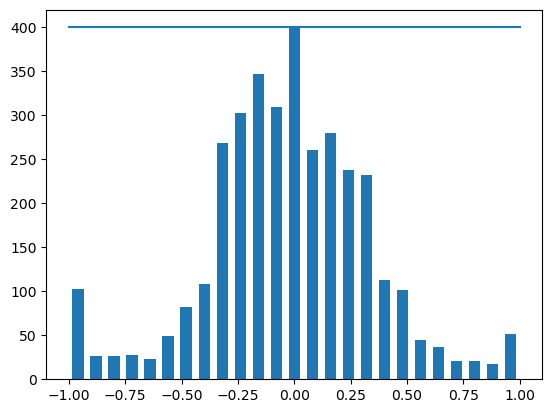

In [36]:
print('total data:', len(data))
remove_list = []
for j in range(num_bins):
  list_ = []
  for i in range(len(data['steering'])):
    if data['steering'][i] >= bins[j] and data['steering'][i] <= bins[j+1]:
      list_.append(i)
  list_ = shuffle(list_)
  list_ = list_[samples_per_bin:]
  remove_list.extend(list_)

print('removed:', len(remove_list))
data.drop(data.index[remove_list], inplace=True)
print('remaining:', len(data))

hist, _ = np.histogram(data['steering'], (num_bins))
plt.bar(center, hist, width=0.05)
plt.plot((np.min(data['steering']), np.max(data['steering'])), (samples_per_bin, samples_per_bin))

In [37]:
print(data.iloc[1])
def load_img_steering(datadir, df):
  image_path = []
  steering = []
  for i in range(len(data)):
    indexed_data = data.iloc[i]
    center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
    image_path.append(os.path.join(datadir, center.strip()))
    steering.append(float(indexed_data[3]))
    # left image append
    image_path.append(os.path.join(datadir,left.strip()))
    steering.append(float(indexed_data[3])+0.15)
    # right image append
    image_path.append(os.path.join(datadir,right.strip()))
    steering.append(float(indexed_data[3])-0.15)
  image_paths = np.asarray(image_path)
  steerings = np.asarray(steering)
  return image_paths, steerings

image_paths, steerings = load_img_steering(datadir + '/IMG', data)

center      center_2024_11_03_19_03_52_052.jpg
left        left_2024_11_03_19_03_52_052.jpg  
right       right_2024_11_03_19_03_52_052.jpg 
steering   -0.102666                          
throttle    1.0                               
reverse     0.0                               
speed       3.15619                           
Name: 30, dtype: object


/tmp/ipykernel_94470/2774632906.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_data[0], indexed_data[1], indexed_data[2]
/tmp/ipykernel_94470/2774632906.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3]))
/tmp/ipykernel_94470/2774632906.py:12: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering.append(float(indexed_data[3])+0.15)
/tmp/ipykernel_94470/27746

In [38]:
X_train, X_valid, y_train, y_valid = train_test_split(image_paths, steerings, test_size=0.2, random_state=6)
print('Training Samples: {}\nValid Samples: {}'.format(len(X_train), len(X_valid)))

Training Samples: 8373
Valid Samples: 2094


Text(0.5, 1.0, 'Validation set')

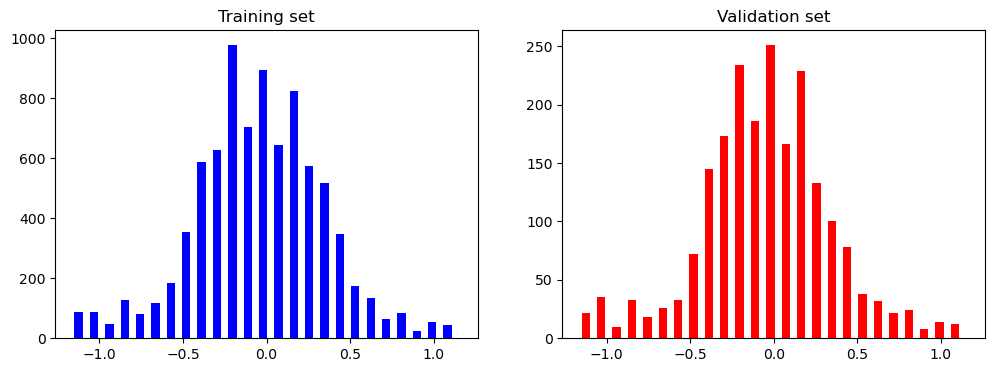

In [39]:
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(y_train, bins=num_bins, width=0.05, color='blue')
axes[0].set_title('Training set')
axes[1].hist(y_valid, bins=num_bins, width=0.05, color='red')
axes[1].set_title('Validation set')

Text(0.5, 1.0, 'Zoomed Image')

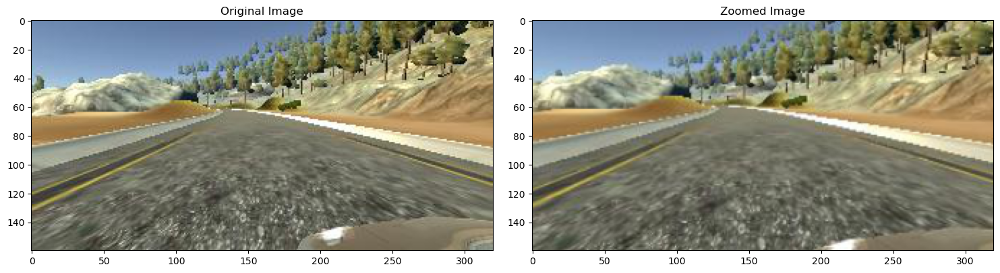

In [40]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

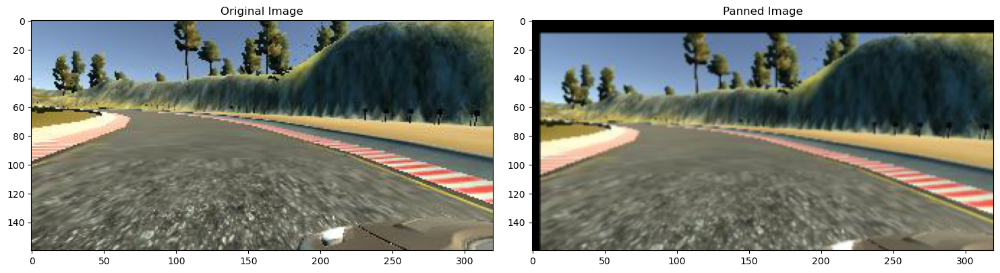

In [41]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

In [42]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

Text(0.5, 1.0, 'Brightness altered image ')

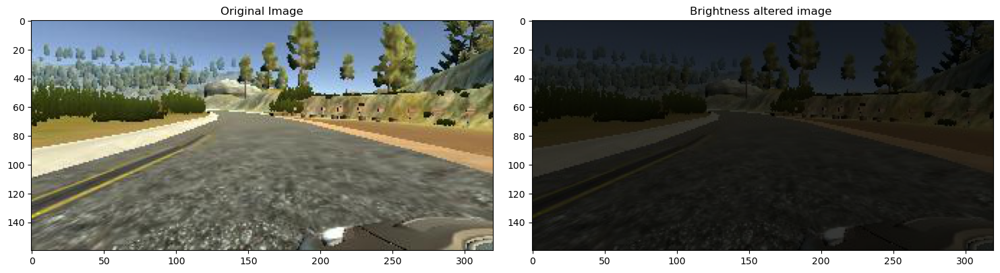

In [43]:
image = image_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')


In [44]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

Text(0.5, 1.0, 'Flipped Image - Steering Angle:0.04341010000000001')

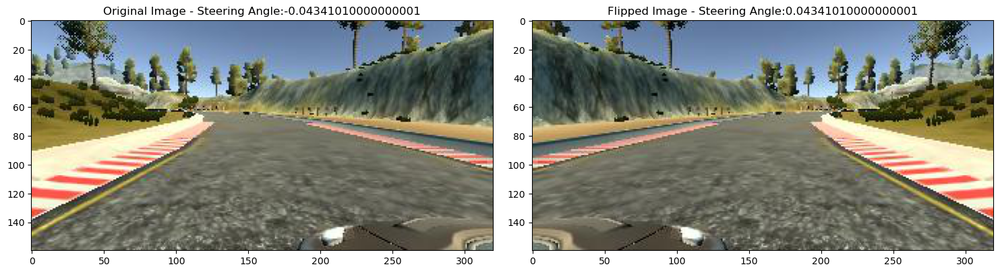

In [45]:
random_index = random.randint(0, 1000)
image = image_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [46]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)

    return image, steering_angle

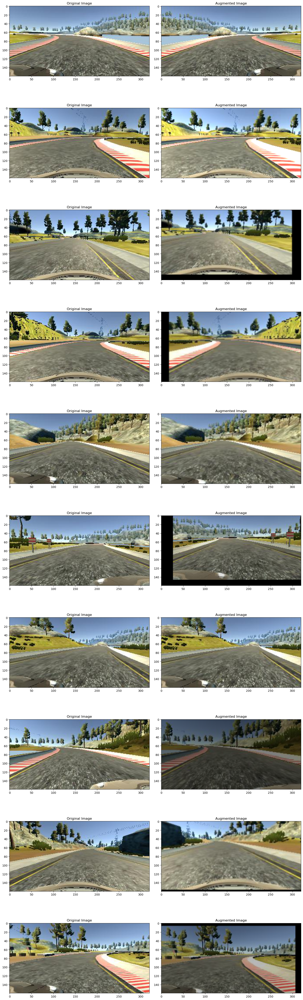

In [47]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(image_paths) - 1)
  random_image = image_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [48]:
def img_preprocess(img):
    img = img[60:135,:,:]
    img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
    img = cv2.GaussianBlur(img,  (3, 3), 0)
    img = cv2.resize(img, (200, 66))
    img = img/255
    return img

Text(0.5, 1.0, 'Preprocessed Image')

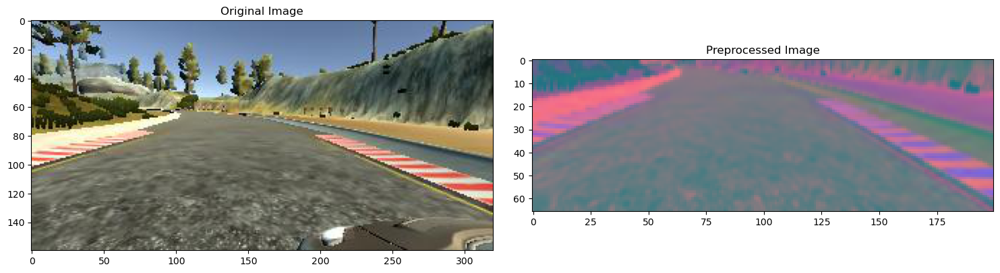

In [49]:
image = image_paths[100]
original_image = mpimg.imread(image)
preprocessed_image = img_preprocess(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()
axs[0].imshow(original_image)
axs[0].set_title('Original Image')
axs[1].imshow(preprocessed_image)
axs[1].set_title('Preprocessed Image')

In [50]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = img_preprocess(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

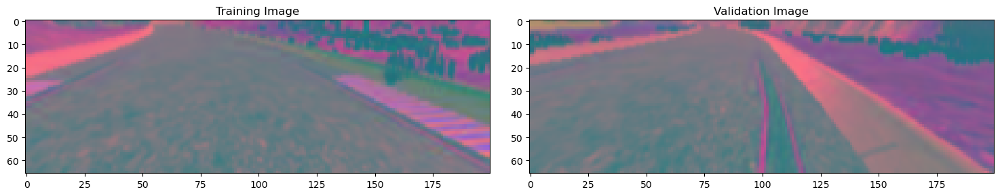

In [51]:
x_train_gen, y_train_gen = next(batch_generator(X_train, y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_valid, y_valid, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [52]:
def nvidia_model():
  model = Sequential()
  model.add(Convolution2D(24, 5, 5, strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, 5, 5, strides=(2, 2), activation='elu'))
  model.add(Convolution2D(48, 5, 5, strides=(2, 2), activation='elu'))
  model.add(Convolution2D(64, 3, 3, activation='elu'))

  model.add(Convolution2D(64, 3, 3, activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = Adam(lr=1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [53]:
def nvidia_model():
  model = Sequential()
  # Pass kernel_size as a tuple
  model.add(Convolution2D(24, (5, 5), strides=(2, 2), input_shape=(66, 200, 3), activation='elu'))
  model.add(Convolution2D(36, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(48, (5, 5), strides=(2, 2), activation='elu'))
  model.add(Convolution2D(64, (3, 3), activation='elu'))

  model.add(Convolution2D(64, (3, 3), activation='elu'))
#   model.add(Dropout(0.5))


  model.add(Flatten())

  model.add(Dense(100, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(50, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(10, activation = 'elu'))
#   model.add(Dropout(0.5))

  model.add(Dense(1))

  optimizer = Adam(1e-3)
  model.compile(loss='mse', optimizer=optimizer)
  return model

In [54]:
model = nvidia_model()
print(model.summary())

/home/anonymous/anaconda3/lib/python3.12/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_5 (Conv2D)               │ (None, 31, 98, 24)     │         1,824 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 14, 47, 36)     │        21,636 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 5, 22, 48)      │        43,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 3, 20, 64)      │        27,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_9 (Conv2D)               │ (None, 1, 18, 64)      │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 100)            │       115,300 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 50)             │         5,050 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 10)             │           510 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 252,219 (985.23 KB)

 Trainable params: 252,219 (985.23 KB)

 Non-trainable params: 0 (0.00 B)

None


In [56]:
history = model.fit(batch_generator(X_train, y_train, 100, 1),
                                  steps_per_epoch=300,
                                  epochs=10,
                                  validation_data=batch_generator(X_valid, y_valid, 100, 0),
                                  validation_steps=200,
                                  verbose=1,
                                  shuffle = 1)

Epoch 1/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 165s 552ms/step - loss: 0.1567 - val_loss: 0.1222
Epoch 2/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 155s 519ms/step - loss: 0.1221 - val_loss: 0.1063
Epoch 3/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 166s 554ms/step - loss: 0.1071 - val_loss: 0.0923
Epoch 4/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 166s 555ms/step - loss: 0.0984 - val_loss: 0.0898
Epoch 5/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 153s 513ms/step - loss: 0.0955 - val_loss: 0.0810
Epoch 6/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 167s 558ms/step - loss: 0.0898 - val_loss: 0.0887
Epoch 7/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 168s 561ms/step - loss: 0.0840 - val_loss: 0.0808
Epoch 8/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 164s 550ms/step - loss: 0.0855 - val_loss: 0.0764
Epoch 9/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 162s 543ms/step - loss: 0.0833 - val_loss: 0.0786
Epoch 10/10
300/300 ━━━━━━━━━━━━━━━━━━━━ 160s 534ms/step - loss: 0.0813 - val_loss: 0.0775


Text(0.5, 0, 'Epoch')

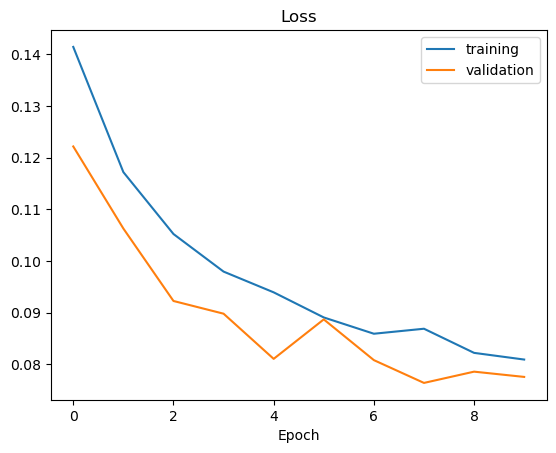

In [57]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.legend(['training', 'validation'])
plt.title('Loss')
plt.xlabel('Epoch')

In [58]:
model.save('model.h5')

In [ ]:
# from google.colab import files
# files.download('model.h5')
